# Import Data

In [3]:
import osmnx as ox
import pandas as pd
import geopandas as gpd


# 1. Load your cleaned deliveries dataset (GeoPackage or CSV with geometry)
deliveries = gpd.read_file(
    "../data/deliveries_clustered_haversine.gpkg",
    engine="pyogrio",
    use_arrow=True
    )

# 2. Load the OSMnx city boundary
hyd_admin = ox.geocode_to_gdf("Hyderabad, Telangana, India")

# 3. Load road network
roads = gpd.read_file(
    "../data/hyd_roads.gpkg",
    engine="pyogrio",
    use_arrow=True
    )

# 4. Load hub location
data_path = '../data/ApexHub_Deliveries.xlsx'
df_dc = pd.read_excel(data_path, sheet_name='Distribution Center Location')
hub_lat, hub_lon = map(float, df_dc.loc[0, 'Hub Coordinates'].split(','))
print(f"Hub coordinates: {hub_lat}, {hub_lon}")

# 5. Project everything to EPSG:3857 for clustering (meters)
deliveries = deliveries.to_crs(epsg=3857)
hyd_admin = hyd_admin.to_crs(epsg=3857)
roads = roads.to_crs(epsg=3857)
hub = gpd.GeoDataFrame(
    {'geometry': [gpd.points_from_xy([hub_lon], [hub_lat])[0]]},
    crs='EPSG:4326'
).to_crs(epsg=3857)



Hub coordinates: 17.235389854, 78.41602866


# Compare OSMNx vs HDX Roads

In [39]:
import osmnx as ox
import matplotlib.pyplot as plt
import geopandas as gpd

# Get Hyderabad boundary polygon (in WGS84 for OSMnx)
hyd_boundary_wgs = hyd_admin.to_crs(epsg=4326).geometry.iloc[0]

# Download 'drive' network within Hyderabad boundary
G_osmnx = ox.graph_from_polygon(hyd_boundary_wgs, network_type='drive_service')


In [40]:
# Convert graph to GeoDataFrames for plotting
nodes_osmnx, edges_osmnx = ox.graph_to_gdfs(G_osmnx)

# Project for plotting
edges_osmnx_web = edges_osmnx.to_crs(epsg=3857)
roads_web = roads.to_crs(epsg=3857)
hyd_admin_web = hyd_admin.to_crs(epsg=3857)


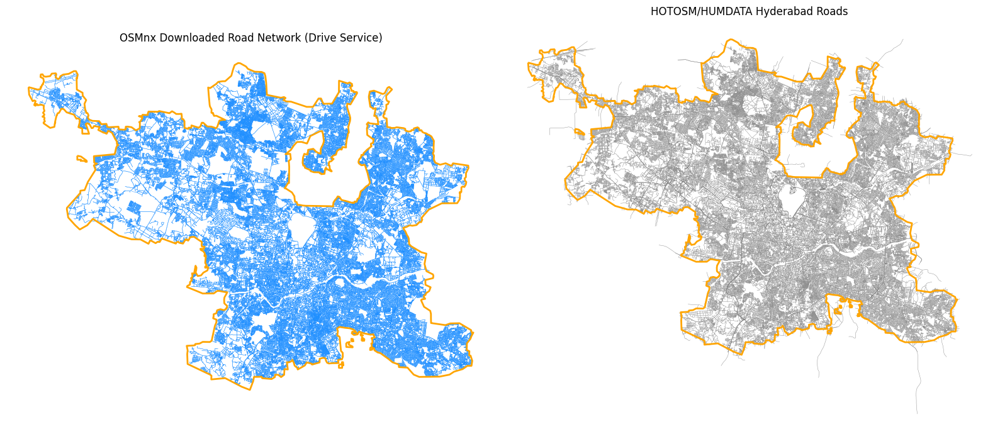

In [41]:
fig, axes = plt.subplots(1, 2, figsize=(16, 10))

# OSMnx graph
edges_osmnx_web.plot(ax=axes[0], linewidth=0.3, color='dodgerblue')
hyd_admin_web.boundary.plot(ax=axes[0], color='orange', linewidth=2)
axes[0].set_title("OSMnx Downloaded Road Network (Drive Service)")
axes[0].set_axis_off()

# Your HOTOSM/HUMDATA clipped roads
roads_web.plot(ax=axes[1], linewidth=0.3, color='gray')
hyd_admin_web.boundary.plot(ax=axes[1], color='orange', linewidth=2)
axes[1].set_title("HOTOSM/HUMDATA Hyderabad Roads")
axes[1].set_axis_off()

plt.tight_layout()

output_path = "../outputs/osmnx_vs_hotosm_hyd_roads.png"
fig.savefig(
    output_path, 
    dpi=500, 
    bbox_inches='tight', 
    transparent=True
)

plt.show()


# Sub-graphs

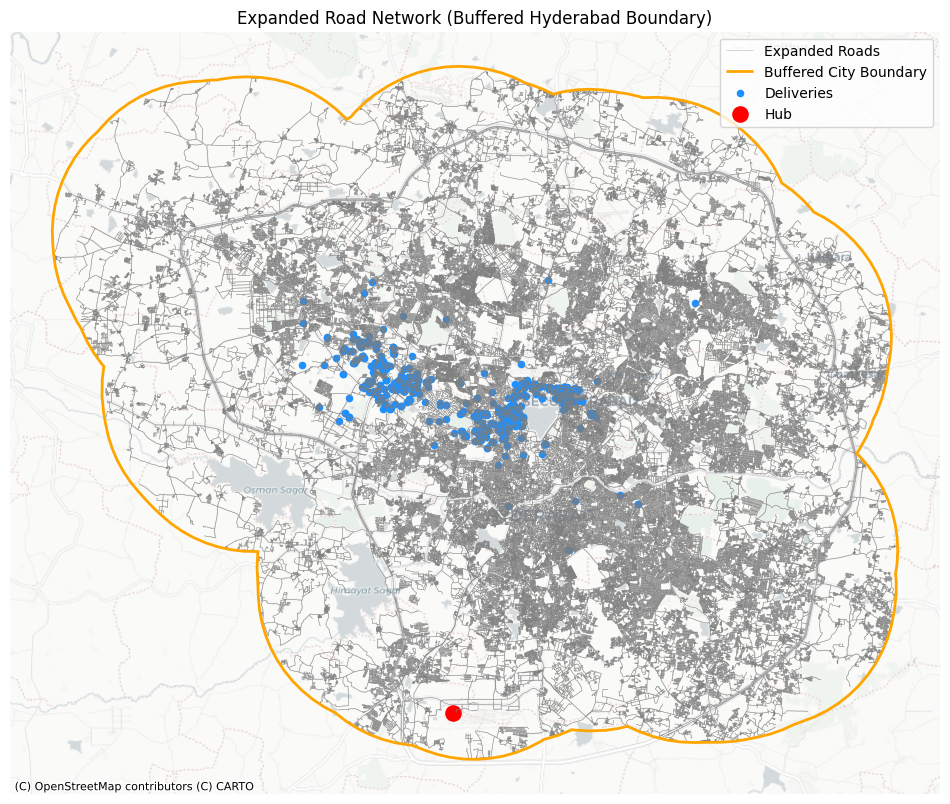

In [32]:
import osmnx as ox
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx

# Buffer in meters using EPSG:3857
hyd_admin_3857 = hyd_admin.to_crs(epsg=3857)
hyd_buffered_3857 = hyd_admin_3857.geometry.buffer(10_000)

# Create GeoDataFrame with EPSG:3857
hyd_buffered_gdf_3857 = gpd.GeoDataFrame(geometry=hyd_buffered_3857, crs="EPSG:3857")

# Project *just the geometry* to EPSG:4326 for OSMnx
hyd_buffered_wgs = hyd_buffered_gdf_3857.to_crs(epsg=4326)
hyd_polygon_buffered = hyd_buffered_wgs.geometry.iloc[0]

# Get the expanded road network
G_osmnx_expanded = ox.graph_from_polygon(hyd_polygon_buffered, network_type='drive')
nodes_exp, edges_exp = ox.graph_to_gdfs(G_osmnx_expanded)

# Make sure ALL layers for plotting are in 3857
edges_exp_3857 = edges_exp.to_crs(epsg=3857)
deliveries_3857 = deliveries.to_crs(epsg=3857)
hub_3857 = hub.to_crs(epsg=3857)

# Plot
fig, ax = plt.subplots(figsize=(12,10))
edges_exp_3857.plot(ax=ax, linewidth=0.4, color='gray', alpha=0.6, label='Expanded Roads')
hyd_buffered_gdf_3857.boundary.plot(ax=ax, color='orange', linewidth=2, label='Buffered City Boundary')
deliveries_3857.plot(ax=ax, color='dodgerblue', markersize=20, label='Deliveries')
hub_3857.plot(ax=ax, color='red', markersize=120, label='Hub')
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
ax.set_axis_off()
plt.legend()
plt.title("Expanded Road Network (Buffered Hyderabad Boundary)")
plt.show()


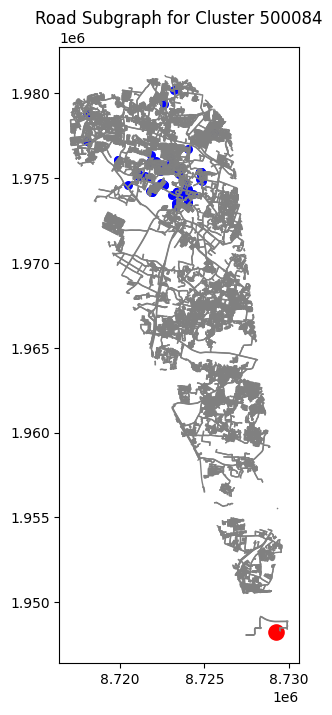

In [ ]:
# import matplotlib.pyplot as plt
# from shapely.geometry import MultiPoint

# # Example: for cluster 500084
# cluster_label = '500084'
# cluster_df = deliveries[deliveries['assigned_pincode'] == cluster_label]

# # Get all points: deliveries in cluster + hub
# all_points = list(cluster_df.geometry) + list(hub.geometry)
# # Create convex hull and buffer it a little (e.g., 1km)
# convex_hull = MultiPoint([pt for pt in all_points]).convex_hull.buffer(1000)  # buffer in meters

# # Project convex hull to WGS84 for OSMnx (graph is in lat/lon)
# convex_hull_wgs = gpd.GeoSeries([convex_hull], crs="EPSG:3857").to_crs(epsg=4326).iloc[0]

# # OSMnx graph nodes are in lat/lon (EPSG:4326)
# node_gdf = ox.graph_to_gdfs(G_osmnx_expanded, nodes=True, edges=False)
# nodes_in_hull = node_gdf[node_gdf.within(convex_hull_wgs)]
# G_sub = G_osmnx_expanded.subgraph(nodes_in_hull.index)

# sub_edges = ox.graph_to_gdfs(G_sub, nodes=False)
# sub_edges_3857 = sub_edges.to_crs(epsg=3857)
# ax = sub_edges_3857.plot(figsize=(8,8), linewidth=1, color='gray')
# cluster_df.to_crs(epsg=3857).plot(ax=ax, color='blue', markersize=30)
# hub_3857.plot(ax=ax, color='red', markersize=120)
# plt.title(f"Road Subgraph for Cluster {cluster_label}")
# plt.show()


In [ ]:
# import osmnx as ox

# # Get hub coordinates (make sure it's in WGS84 for OSMnx)
# hub_point = hub_gdf.geometry.iloc[0]
# if hub_gdf.crs.to_epsg() != 4326:
#     hub_point = hub_gdf.to_crs(4326).geometry.iloc[0]

# # Find nearest node to hub in G_sub (should work, if hub is inside G_sub)
# hub_node = ox.nearest_nodes(G_sub, hub_point.x, hub_point.y)

# # Similarly, get delivery node IDs (as before)
# delivery_nodes = [ox.nearest_nodes(G_sub, point.x, point.y) for point in cluster_df.geometry]

# # Now check connectivity
# for deliv_node in delivery_nodes:
#     if not nx.has_path(G_sub, hub_node, deliv_node):
#         print(f"No path from hub to delivery node {deliv_node}")

### ! seems there is disconnection from hub to deliveries within subgraphs, needs research 

No path from hub to delivery node 9838321547
No path from hub to delivery node 3602398400
No path from hub to delivery node 2225419826
No path from hub to delivery node 2766314839
No path from hub to delivery node 2763929147
No path from hub to delivery node 9838321547
No path from hub to delivery node 6150838829
No path from hub to delivery node 2225419826
No path from hub to delivery node 2225419574
No path from hub to delivery node 4206881267
No path from hub to delivery node 2763929147
No path from hub to delivery node 4191593452
No path from hub to delivery node 11502441386
No path from hub to delivery node 3109335283
No path from hub to delivery node 1655564105
No path from hub to delivery node 6150838829
No path from hub to delivery node 11502441386
No path from hub to delivery node 2763929147
No path from hub to delivery node 9838321547
No path from hub to delivery node 9838321547
No path from hub to delivery node 3602398400
No path from hub to delivery node 2763929147
No path 

# Benchmark Route Opt Algos

## Nearest Neighbor

In [73]:
import time
import networkx as nx
import numpy as np
import osmnx as ox

def nearest_neighbor_route(deliveries_gdf, hub_gdf, G, cluster_label=None, debug=False):
    """
    deliveries_gdf: GeoDataFrame for this cluster (EPSG:3857)
    hub_gdf: GeoDataFrame, single row, for the hub (EPSG:3857)
    G: OSMnx road network (should be in WGS84/EPSG:4326)
    cluster_label: for logging (assigned_pincode or similar)
    debug: for debugging key algo steps
    Returns: standardized results dict
    """
    # Project all points to WGS84 for OSMnx
    deliv_wgs = deliveries_gdf.to_crs(epsg=4326)
    hub_wgs = hub_gdf.to_crs(epsg=4326)
    
    # Get nearest network node for hub and deliveries
    hub_point = hub_wgs.geometry.iloc[0]
    hub_node = ox.nearest_nodes(G, hub_point.x, hub_point.y)
    deliv_nodes = ox.nearest_nodes(G, deliv_wgs.geometry.x, deliv_wgs.geometry.y)
    unvisited = set(deliv_nodes)
    
    # Start route at the hub
    current_node = hub_node
    route_nodes = [hub_node]
    total_length = 0.0
    t0 = time.time()
    if debug:
        print(f"Hub node: {hub_node}")
        print(f"Total Delivery nodes: {len(list(deliv_nodes))}")
    
    step = 0
    while unvisited:
        step += 1
        # Find nearest unvisited delivery node
        lengths = {n: np.inf for n in unvisited}
        for n in unvisited:
            try:
                lengths[n] = nx.shortest_path_length(G, current_node, n, weight='length')
            except nx.NetworkXNoPath:
                if debug:
                    print(f"[Step {step}] No path from {current_node} to {n}")
        next_node = min(lengths, key=lengths.get)
        if np.isinf(lengths[next_node]):
            if debug:
                print(f"[Step {step}] Could not find next node from {current_node}, disconnected, breaking loop.")
            break
        total_length += lengths[next_node]
        route_nodes.append(next_node)
        if debug:
            print(
                f"[Step {step}] Moved from {current_node} to {next_node}, distance: {lengths[next_node]:.1f} m, remaining: {len(unvisited)-1}"
                )
        current_node = next_node
        unvisited.remove(next_node)
    
    # Return to hub
    try:
        back_length = nx.shortest_path_length(G, current_node, hub_node, weight='length')
    except nx.NetworkXNoPath:
        back_length = 0
        if debug:
            print(f"Cannot return from {current_node} to hub {hub_node}")
    total_length += back_length
    route_nodes.append(hub_node)
    t1 = time.time()
    
    # For plotting: get (lat, lon)
    node_xy = []
    for n in route_nodes:
        data = G.nodes[n]
        node_xy.append((data['y'], data['x']))  # (lat, lon)
    
    if debug:
        print(f"Total route distance: {total_length/1000:.2f} km. Time: {t1-t0:.2f} s")

    return {
        'assigned_pincode': cluster_label,
        'algorithm': 'Nearest Neighbor',
        'ordered_node_ids': route_nodes,
        'ordered_latlon': node_xy,
        'total_distance_km': total_length / 1000,
        'run_time_seconds': t1 - t0,
        'notes': ''
    }


In [69]:
import matplotlib.pyplot as plt
import contextily as ctx
from shapely.geometry import LineString
import geopandas as gpd

def plot_route_on_map(
        G, ordered_node_ids,
        gdfs,
        cluster_label=None,
        title=None,
        savefig=True
        ):

    # Prepare GeoDataFrames, project for plotting
    deliveries_3857 = gdfs['deliveries'].to_crs(epsg=3857)
    hub_3857 = gdfs['hub'].to_crs(epsg=3857)
    admin_3857 = gdfs['admin'].to_crs(epsg=3857)
    edges_gdf_3857 = gdfs['edges'].to_crs(epsg=3857)

    # Collect all coordinates along the path
    full_route_coords = []

    for i in range(len(ordered_node_ids) - 1):
        try:
            path = nx.shortest_path(G, ordered_node_ids[i], ordered_node_ids[i+1], weight='length')
            coords = [(G.nodes[n]['x'], G.nodes[n]['y']) for n in path]
            full_route_coords.extend(coords if i == 0 else coords[1:])  # skip first if overlapping
        except nx.NetworkXNoPath:
            print(f"No path from {ordered_node_ids[i]} to {ordered_node_ids[i+1]} — skipping segment")
            continue

    # Create a LineString for the route
    route_line = LineString(full_route_coords)
    route_gdf = gpd.GeoDataFrame(geometry=[route_line], crs="EPSG:4326").to_crs(epsg=3857)
    
    # Plot
    fig, ax = plt.subplots(figsize=(12, 10))
    edges_gdf_3857.plot(ax=ax, linewidth=0.4, color='gray', alpha=0.6, label='Road Network')
    admin_3857.boundary.plot(ax=ax, color='orange', linewidth=2, alpha=0.8)
    deliveries_3857.plot(ax=ax, color='dodgerblue', markersize=40, label='Deliveries', alpha=0.7)
    hub_3857.plot(ax=ax, color='red', markersize=120, label='Hub')
    route_gdf.plot(ax=ax, color='purple', linewidth=3, alpha=0.8, label='NN True Path')
    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
    ax.set_axis_off()
    plt.legend()
    if title is None and cluster_label is not None:
        title = f"NN Route (True Path) - {cluster_label}"
    plt.title(title or "NN Route (True Path)")
    if savefig and cluster_label is not None:
        output_path = f"../outputs/route_{cluster_label}.png"
        plt.savefig(output_path, bbox_inches="tight", dpi=500, transparent=True)
    plt.show()


In [ ]:
# For a single cluster (e.g., assigned_pincode == 500084)
cluster_label = "500084"
cluster_df = deliveries[deliveries['assigned_pincode'] == cluster_label]
result_nn = nearest_neighbor_route(
    cluster_df, hub, G_osmnx_expanded, 
    cluster_label=cluster_label, debug=True
    )
print(result_nn)


Hub node: 2578563669
Delivery nodes: [np.int64(1750184519), np.int64(1699091370), np.int64(2090724753), np.int64(351875612), np.int64(2232093789), np.int64(11046162342), np.int64(11033695528), np.int64(6507536169), np.int64(2228998065), np.int64(11306518107), np.int64(2249841991), np.int64(2807852291), np.int64(2807852291), np.int64(2807852291), np.int64(2807852291), np.int64(2807852291), np.int64(10301765791), np.int64(2232093789), np.int64(2807852291), np.int64(2228597073), np.int64(11812909191), np.int64(2228997848), np.int64(1301979436), np.int64(1301983319), np.int64(3602325809), np.int64(2807852291), np.int64(2807852299), np.int64(2231948978), np.int64(2232094113), np.int64(1699060701), np.int64(3602308516), np.int64(11032104731), np.int64(7694025351), np.int64(2852837352), np.int64(3602310696), np.int64(1301983319), np.int64(12014486483), np.int64(2231949097), np.int64(6507536169), np.int64(2807852291), np.int64(6507536169), np.int64(2807852291), np.int64(1699060701), np.int64(1

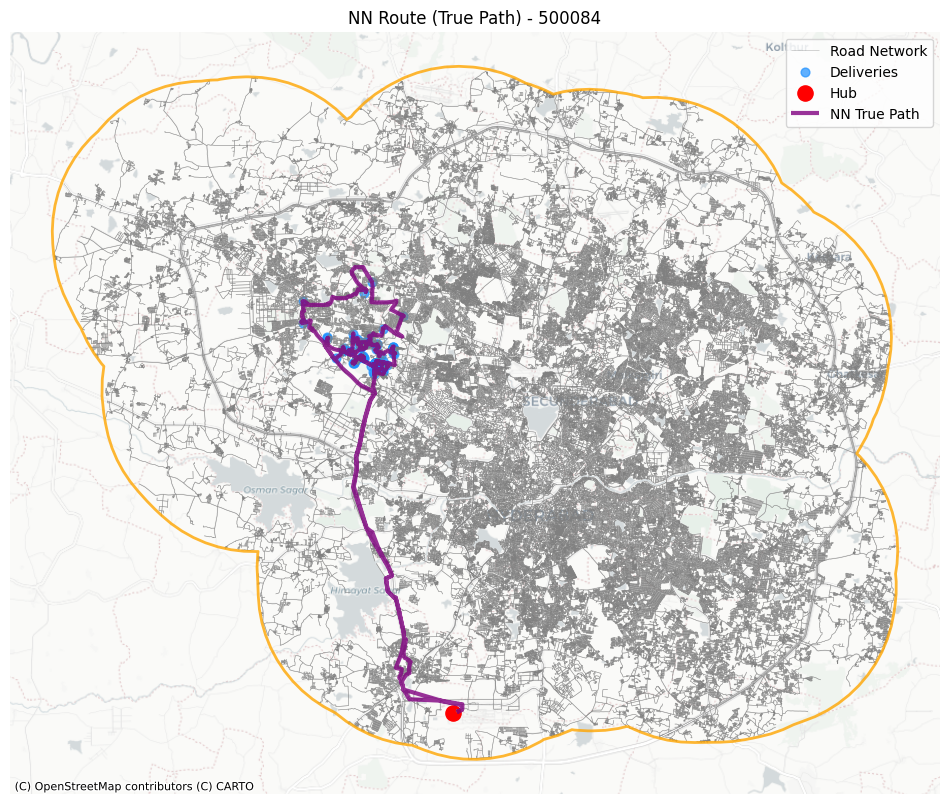

In [71]:
gdfs = {
    'deliveries': cluster_df,
    'hub': hub,
    'admin': hyd_buffered_gdf_3857,
    'edges': edges_exp_3857
}

plot_route_on_map(
    G_osmnx_expanded,
    result_nn['ordered_node_ids'], gdfs,
    cluster_label=result_nn['assigned_pincode'],
    savefig=True
    )

In [54]:
result_nn

{'assigned_pincode': '500084',
 'algorithm': 'Nearest Neighbor',
 'ordered_node_ids': [2578563669,
  np.int64(351875612),
  np.int64(1699091370),
  np.int64(1042219307),
  np.int64(12718183721),
  np.int64(3602308413),
  np.int64(11135474027),
  np.int64(12800012561),
  np.int64(11032104731),
  np.int64(10301765791),
  np.int64(2807852291),
  np.int64(2807852299),
  np.int64(11033695528),
  np.int64(12086549825),
  np.int64(2249841991),
  np.int64(6507536169),
  np.int64(11306518107),
  np.int64(1301947596),
  np.int64(2852837352),
  np.int64(1699060701),
  np.int64(1699084291),
  np.int64(3602310696),
  np.int64(2232093789),
  np.int64(2231576522),
  np.int64(2228997848),
  np.int64(2231576435),
  np.int64(3602310144),
  np.int64(2231576861),
  np.int64(2228998065),
  np.int64(2231577306),
  np.int64(7694025351),
  np.int64(3602309654),
  np.int64(2231948989),
  np.int64(2231948978),
  np.int64(2231949097),
  np.int64(7694126509),
  np.int64(2232094113),
  np.int64(1301983319),
  np.i

In [46]:
deliveries.assigned_pincode.unique()

array(['500001', '500033', '500081', '500084', '500032'], dtype=object)

In [72]:
def optimize_routes_for_all_clusters(deliveries, hub, G, debug=False):
    results = []
    for cluster_label in deliveries['assigned_pincode'].unique():
        if cluster_label in ["500001"]:
            continue
        print(f"Processing Cluster for Pincode {cluster_label}")
        cluster_df = deliveries[deliveries['assigned_pincode'] == cluster_label]
        try:
            result = nearest_neighbor_route(
                cluster_df, hub, G,
                cluster_label=cluster_label, debug=debug
            )
            results.append(result)
        except Exception as e:
            print(f"Cluster {cluster_label}: Error - {e}")
            # Optionally append a failed result dict
    return results

# Usage
results = optimize_routes_for_all_clusters(deliveries, hub, G_osmnx_expanded, debug=True)
results_df = pd.DataFrame(results)


Processing Cluster for Pincode 500033
Hub node: 2578563669
Delivery nodes: [np.int64(1324174605), np.int64(1314804081), np.int64(1324174605), np.int64(1324174605), np.int64(3602300077), np.int64(1324174605), np.int64(3602299822), np.int64(3602299822), np.int64(12520870329), np.int64(3579914072), np.int64(1324174605), np.int64(10703286800), np.int64(356327976), np.int64(2881689852), np.int64(2881689852), np.int64(1324174605), np.int64(11843664150), np.int64(2461452194), np.int64(3670021848), np.int64(2822546668), np.int64(2822546668), np.int64(2822546668), np.int64(2822546668), np.int64(1948881751), np.int64(324210294), np.int64(3146877632), np.int64(3579915379), np.int64(3579915252), np.int64(11133276001), np.int64(1312749347), np.int64(11885729740), np.int64(7000601823), np.int64(3579914193), np.int64(7682662072), np.int64(3602300218), np.int64(4173972755), np.int64(11043722956), np.int64(4260151403), np.int64(2881689852), np.int64(12520870329), np.int64(12520870329), np.int64(2881689

In [76]:
results_df

,assigned_pincode,algorithm,ordered_node_ids,ordered_latlon,total_distance_km,run_time_seconds,notes
0,500033,Nearest Neighbor,"[2578563669, 11133276001, 1293103435, 41739727...","[(17.2359885, 78.4185089), (17.40569, 78.40373...",131.192344,96.995744,
1,500081,Nearest Neighbor,"[2578563669, 9684884111, 11491085248, 31715964...","[(17.2359885, 78.4185089), (17.4288942, 78.374...",123.266986,60.241970,
2,500084,Nearest Neighbor,"[2578563669, 351875612, 1699091370, 1042219307...","[(17.2359885, 78.4185089), (17.4509127, 78.363...",126.710136,65.637260,
3,500032,Nearest Neighbor,"[2578563669, 10081763564, 5432656045, 22460728...","[(17.2359885, 78.4185089), (17.4233063, 78.347...",88.643928,22.902496,


### Plots

In [ ]:
gdfs = {
    'deliveries': cluster_df,
    'hub': hub,
    'admin': hyd_buffered_gdf_3857,
    'edges': edges_exp_3857
}

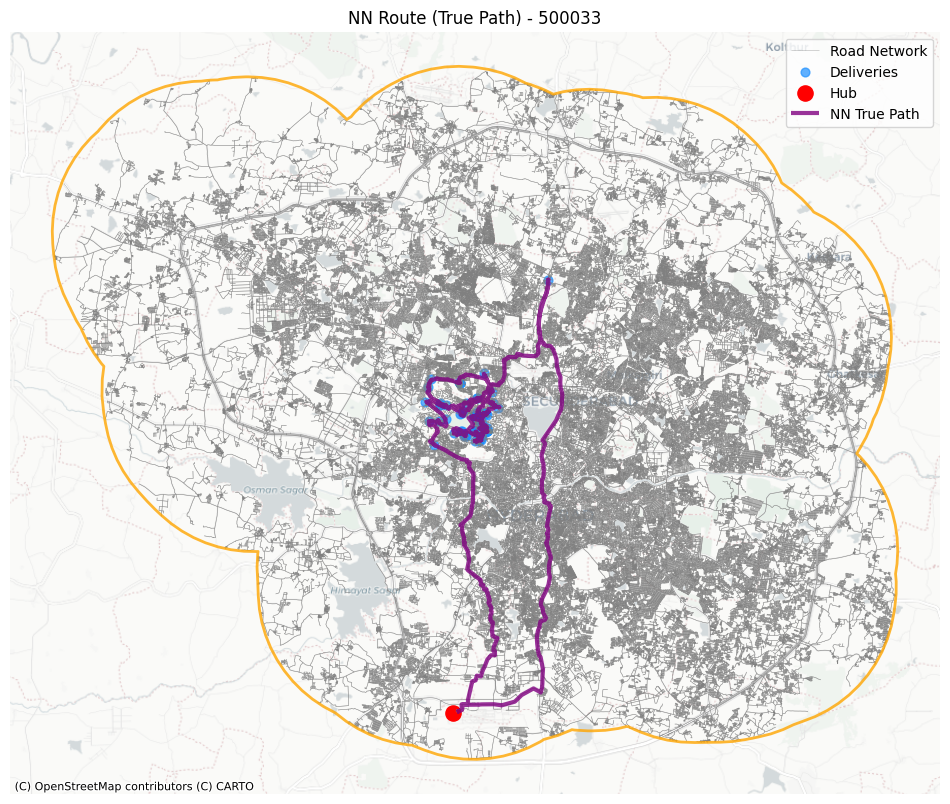

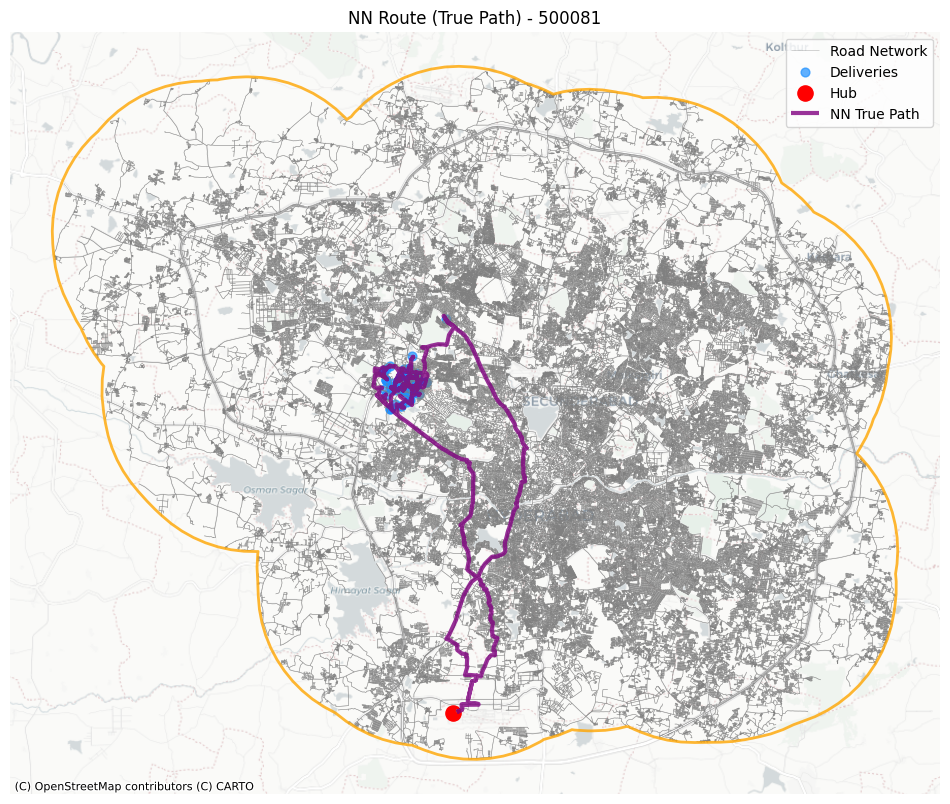

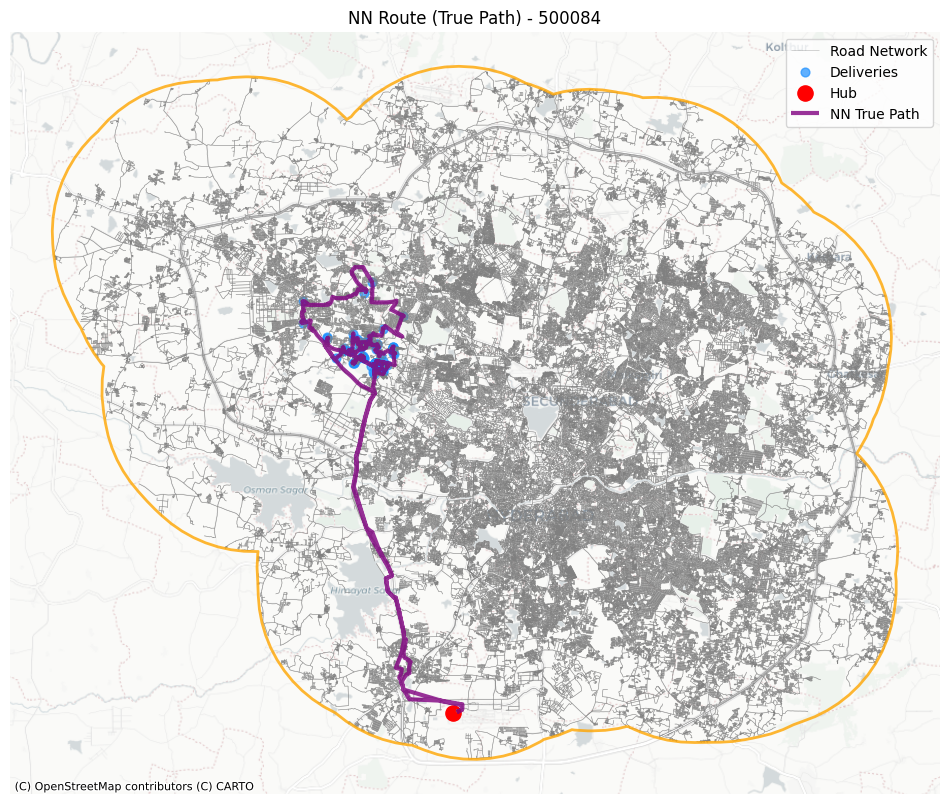

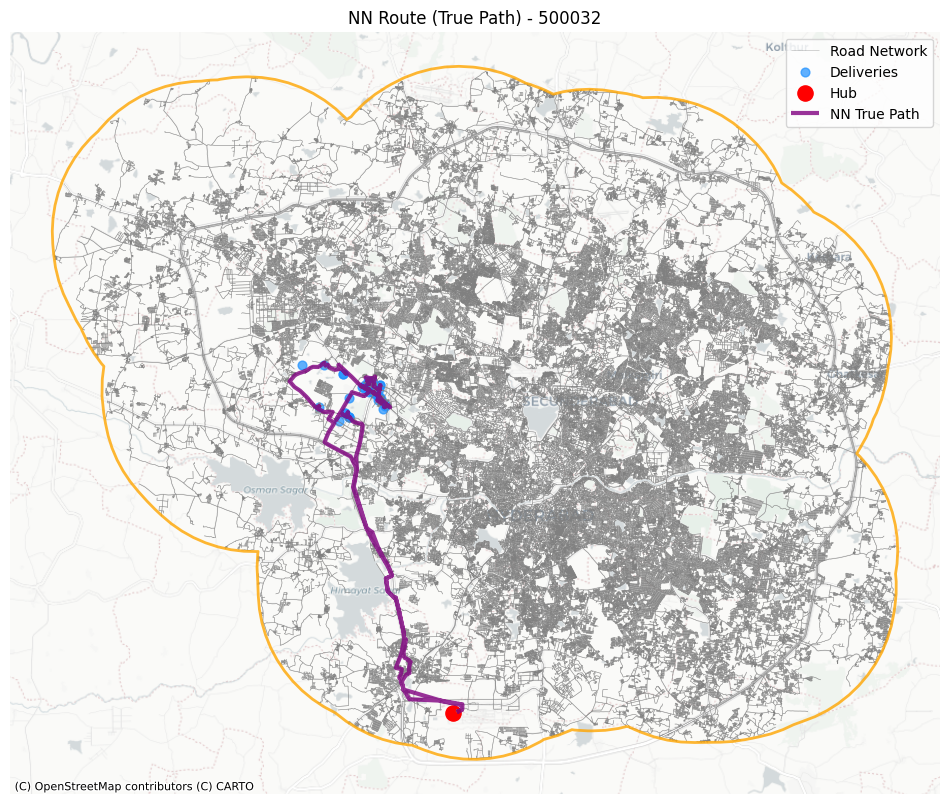

In [80]:
for result in results:
    node_ids = result['ordered_node_ids']
    cluster_label = result['assigned_pincode']
    cluster_df = deliveries[deliveries['assigned_pincode'] == cluster_label]
    gdfs['deliveries'] = cluster_df
    plot_route_on_map(
        G_osmnx_expanded,
        node_ids, gdfs,
        cluster_label=cluster_label,
        savefig=True
    )


# Modular

In [87]:
import networkx as nx

def euclidean_heuristic(u, v, G):
    # Returns simple Euclidean distance between node u and v (in meters)
    x1, y1 = G.nodes[u]['x'], G.nodes[u]['y']
    x2, y2 = G.nodes[v]['x'], G.nodes[v]['y']
    return ((x1 - x2)**2 + (y1 - y2)**2)**0.5

def haversine_heuristic(u, v, G):
    # Returns haversine distance in meters
    from math import radians, sin, cos, sqrt, atan2
    lon1, lat1 = G.nodes[u]['x'], G.nodes[u]['y']
    lon2, lat2 = G.nodes[v]['x'], G.nodes[v]['y']
    R = 6_371_000  # meters
    phi1, phi2 = radians(lat1), radians(lat2)
    dphi = radians(lat2 - lat1)
    dlambda = radians(lon2 - lon1)
    a = sin(dphi / 2) ** 2 + cos(phi1) * cos(phi2) * sin(dlambda / 2) ** 2
    return 2 * R * atan2(sqrt(a), sqrt(1 - a))

def solve_route(G, source, target, algorithm="dijkstra", heuristic_fn=None, debug=False):
    if algorithm == "dijkstra":
        return nx.shortest_path(G, source, target, weight='length', method='dijkstra')
    elif algorithm == "bellman-ford":
        return nx.shortest_path(G, source, target, weight='length', method='bellman-ford')
    elif algorithm == "astar":
        if heuristic_fn is None:
            raise ValueError("Heuristic function required for A*")
        return nx.astar_path(G, source, target, heuristic=lambda u, v: heuristic_fn(u, v, G), weight='length')
    else:
        raise ValueError(f"Algorithm '{algorithm}' not implemented")


In [ ]:
import time
import numpy as np
import osmnx as ox


def nearest_neighbor_route(
    deliveries_gdf, 
    hub_gdf, 
    G, 
    algorithm='dijkstra',
    heuristic_fn=None,
    cluster_label=None, 
    debug=False
):
    """
    Computes a delivery route from a hub to a set of delivery points using a greedy nearest-neighbor approach,
    where each step travels to the nearest unvisited delivery node along the real road network.

    The route is calculated using the specified shortest-path algorithm ('dijkstra', 'bellman-ford', or 'astar').
    Optionally supports custom heuristics for A*.

    Args:
        deliveries_gdf (GeoDataFrame): Delivery locations for this cluster (projected to EPSG:3857).
        hub_gdf (GeoDataFrame): Single-row GeoDataFrame for the hub location (projected to EPSG:3857).
        G (networkx.MultiDiGraph): OSMnx road network graph (must be in WGS84/EPSG:4326).
        algorithm (str): Shortest path algorithm to use ('dijkstra', 'bellman-ford', or 'astar'). Default is 'dijkstra'.
        heuristic_fn (callable, optional): Heuristic function for A*. Should take arguments (u, v, G). Required if algorithm='astar'.
        cluster_label (str or int, optional): Label for this cluster/run (e.g., assigned pincode).
        debug (bool): If True, print stepwise progress and diagnostic info.

    Returns:
        dict: Standardized dictionary containing:
            - 'assigned_pincode': The cluster label (e.g., pincode)
            - 'algorithm': Name of the algorithm used
            - 'ordered_node_ids': List of node IDs visited in order (start → deliveries → return)
            - 'ordered_latlon': List of (lat, lon) tuples for each route node
            - 'total_distance_km': Total route length in kilometers
            - 'run_time_seconds': Total run time (seconds)
            - 'notes': Miscellaneous notes (e.g., error or disconnected info)
    """
    if debug:
        print(f"Solving route using {algorithm.title()} algorithm.")

    # Project all points to WGS84 for OSMnx
    deliv_wgs = deliveries_gdf.to_crs(epsg=4326)
    hub_wgs = hub_gdf.to_crs(epsg=4326)
    
    # Get nearest network node for hub and deliveries
    hub_point = hub_wgs.geometry.iloc[0]
    hub_node = ox.nearest_nodes(G, hub_point.x, hub_point.y)
    deliv_nodes = ox.nearest_nodes(G, deliv_wgs.geometry.x, deliv_wgs.geometry.y)
    unvisited = set(deliv_nodes)
    
    # Start route at the hub
    current_node = hub_node
    route_nodes = [hub_node]
    total_length = 0.0
    t0 = time.time()
    if debug:
        print(f"Hub node: {hub_node}")
        print(f"Total Delivery nodes: {len(list(deliv_nodes))}")
    
    step = 0
    while unvisited:
        step += 1
        lengths = {}
        for n in unvisited:
            try:
                path = solve_route(G, current_node, n, algorithm=algorithm, heuristic_fn=heuristic_fn, debug=debug)
                length = sum(G.edges[u, v, 0]['length'] for u, v in zip(path[:-1], path[1:]))
                lengths[n] = length
            except nx.NetworkXNoPath:
                lengths[n] = np.inf
                if debug:
                    print(f"[Step {step}] No path from {current_node} to {n}")
        if not lengths:
            if debug: print(f"[Step {step}] No unvisited nodes remain.")
            break
        next_node = min(lengths, key=lengths.get)
        if np.isinf(lengths[next_node]):
            if debug:
                print(f"[Step {step}] Could not find next node from {current_node}, disconnected, breaking loop.")
            break
        total_length += lengths[next_node]
        route_nodes.append(next_node)
        if debug:
            print(
                f"[Step {step}] Moved from {current_node} to {next_node}, "
                f"distance: {lengths[next_node]:.1f} m, remaining: {len(unvisited)-1}"
            )
        current_node = next_node
        unvisited.remove(next_node)
    
    # Return to hub
    try:
        path = solve_route(G, current_node, hub_node, algorithm=algorithm, heuristic_fn=heuristic_fn, debug=debug)
        back_length = sum(G.edges[u, v, 0]['length'] for u, v in zip(path[:-1], path[1:]))
    except nx.NetworkXNoPath:
        back_length = 0
        if debug:
            print(f"Cannot return from {current_node} to hub {hub_node}")
    total_length += back_length
    route_nodes.append(hub_node)
    t1 = time.time()
    
    # For plotting: get (lat, lon)
    node_xy = []
    for n in route_nodes:
        data = G.nodes[n]
        node_xy.append((data['y'], data['x']))  # (lat, lon)
    
    if debug:
        print(f"Total route distance: {total_length/1000:.2f} km. Time: {t1-t0:.2f} s")

    return {
        'assigned_pincode': cluster_label,
        'algorithm': algorithm,
        'ordered_node_ids': route_nodes,
        'ordered_latlon': node_xy,
        'total_distance_km': total_length / 1000,
        'run_time_seconds': t1 - t0,
        'notes': ''
    }


In [95]:
def optimize_routes_for_all_clusters(
    deliveries, 
    hub, 
    G, 
    route_fn=nearest_neighbor_route,
    algorithm='dijkstra',
    heuristic_fn=None,
    skip_labels=("500001",),
    debug=False,
    **extra_kwargs
):
    """
    route_fn: Function with signature route_fn(cluster_df, hub, G, ...)
    algorithm: e.g. 'dijkstra', 'astar'
    heuristic_fn: if algorithm is 'astar'
    skip_labels: tuple/list of cluster labels to skip (outliers)
    extra_kwargs: any other params to your route_fn
    """
    results = []
    for cluster_label in deliveries['assigned_pincode'].unique():
        if cluster_label in skip_labels:
            continue
        print(f"Processing Cluster for Pincode {cluster_label}")
        cluster_df = deliveries[deliveries['assigned_pincode'] == cluster_label]
        try:
            result = route_fn(
                cluster_df, hub, G,
                algorithm=algorithm,
                heuristic_fn=heuristic_fn,
                cluster_label=cluster_label,
                debug=debug,
                **extra_kwargs
            )
            results.append(result)
        except Exception as e:
            print(f"Cluster {cluster_label}: Error - {e}")
            # Optionally append a failed result dict or skip
    return results


In [96]:
results_astar = optimize_routes_for_all_clusters(
    deliveries, hub, G_osmnx_expanded,
    algorithm='astar',
    heuristic_fn=euclidean_heuristic,
    debug=True
)

Processing Cluster for Pincode 500033
Solving route using Astar
Hub node: 2578563669
Total Delivery nodes: 91
[Step 1] Moved from 2578563669 to 11133276001, distance: 25331.9 m, remaining: 51
[Step 2] Moved from 11133276001 to 1293103435, distance: 2741.3 m, remaining: 50
[Step 3] Moved from 1293103435 to 4173972755, distance: 896.4 m, remaining: 49
[Step 4] Moved from 4173972755 to 1948881751, distance: 1424.8 m, remaining: 48
[Step 5] Moved from 1948881751 to 3670021848, distance: 1904.0 m, remaining: 47
[Step 6] Moved from 3670021848 to 353759610, distance: 1152.6 m, remaining: 46
[Step 7] Moved from 353759610 to 3146877632, distance: 521.9 m, remaining: 45
[Step 8] Moved from 3146877632 to 11885729740, distance: 669.8 m, remaining: 44
[Step 9] Moved from 11885729740 to 356327976, distance: 1812.5 m, remaining: 43
[Step 10] Moved from 356327976 to 1312749347, distance: 1055.1 m, remaining: 42
[Step 11] Moved from 1312749347 to 7712848966, distance: 1104.8 m, remaining: 41
[Step 12] 

In [ ]:
import matplotlib.pyplot as plt
import contextily as ctx
from shapely.geometry import LineString
import geopandas as gpd

def plot_route_on_map(
        G, ordered_node_ids,
        gdfs,
        cluster_label=None,
        algorithm="dijkstra",
        title=None,
        savefig=True
        ):

    # Prepare GeoDataFrames, project for plotting
    deliveries_3857 = gdfs['deliveries'].to_crs(epsg=3857)
    hub_3857 = gdfs['hub'].to_crs(epsg=3857)
    admin_3857 = gdfs['admin'].to_crs(epsg=3857)
    edges_gdf_3857 = gdfs['edges'].to_crs(epsg=3857)

    # Collect all coordinates along the path
    full_route_coords = []

    for i in range(len(ordered_node_ids) - 1):
        try:
            path = nx.shortest_path(G, ordered_node_ids[i], ordered_node_ids[i+1], weight='length')
            coords = [(G.nodes[n]['x'], G.nodes[n]['y']) for n in path]
            full_route_coords.extend(coords if i == 0 else coords[1:])  # skip first if overlapping
        except nx.NetworkXNoPath:
            print(f"No path from {ordered_node_ids[i]} to {ordered_node_ids[i+1]} — skipping segment")
            continue

    # Create a LineString for the route
    route_line = LineString(full_route_coords)
    route_gdf = gpd.GeoDataFrame(geometry=[route_line], crs="EPSG:4326").to_crs(epsg=3857)
    
    # Plot
    fig, ax = plt.subplots(figsize=(12, 10))
    edges_gdf_3857.plot(ax=ax, linewidth=0.4, color='gray', alpha=0.6, label='Road Network')
    admin_3857.boundary.plot(ax=ax, color='orange', linewidth=2, alpha=0.8)
    deliveries_3857.plot(ax=ax, color='dodgerblue', markersize=40, label='Deliveries', alpha=0.7)
    hub_3857.plot(ax=ax, color='red', markersize=120, label='Hub')
    route_gdf.plot(ax=ax, color='purple', linewidth=3, alpha=0.8, label=f'{algorithm.title()} True Path')
    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
    ax.set_axis_off()
    plt.legend()

    # Save figure
    if title is None and cluster_label is not None:
        title = f"{algorithm.title()} Route (True Path) - {cluster_label}"
    plt.title(title or "Route (True Path)")
    if savefig and cluster_label is not None:
        output_path = f"../outputs/route_{cluster_label}_{algorithm.lower()}.png"
        plt.savefig(output_path, bbox_inches="tight", dpi=500, transparent=True)

    plt.show()


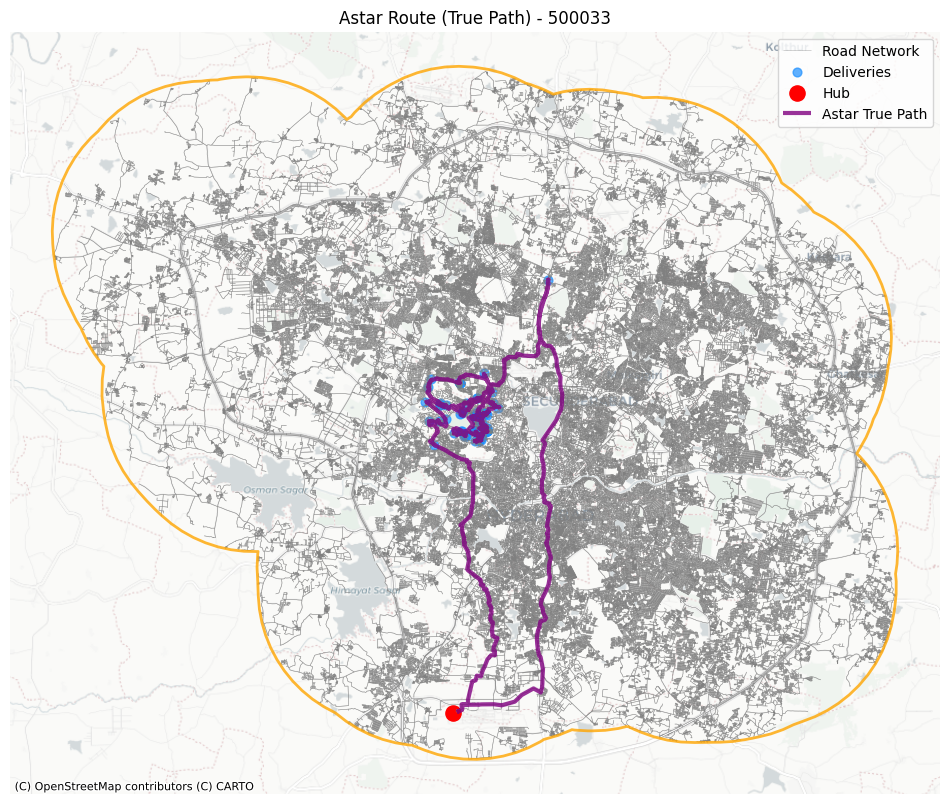

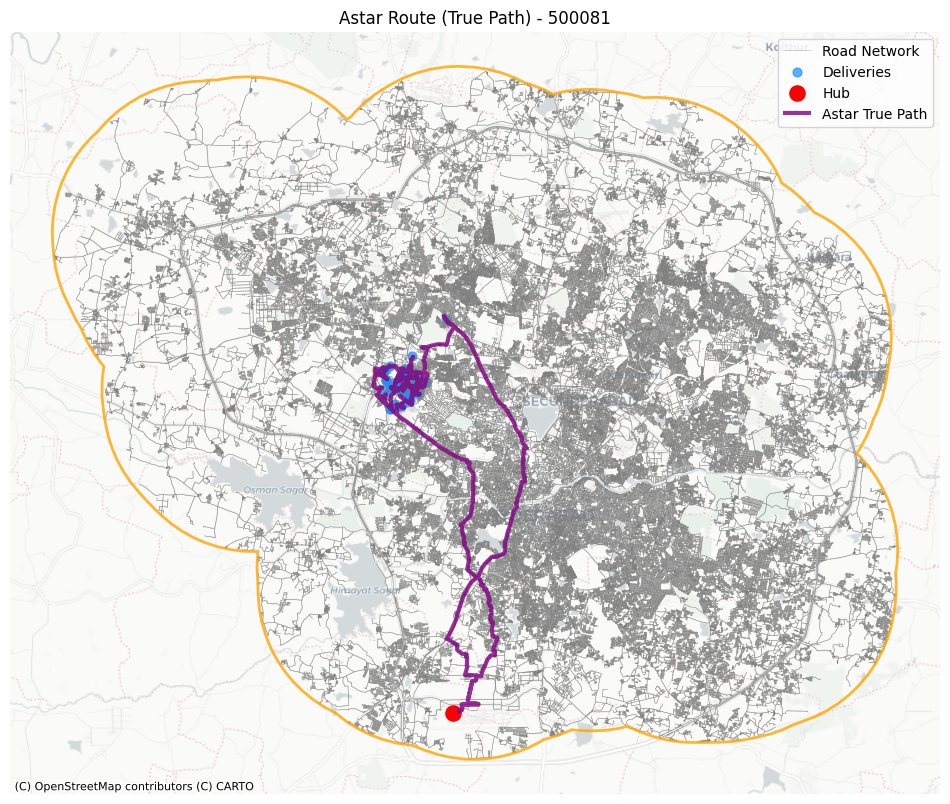

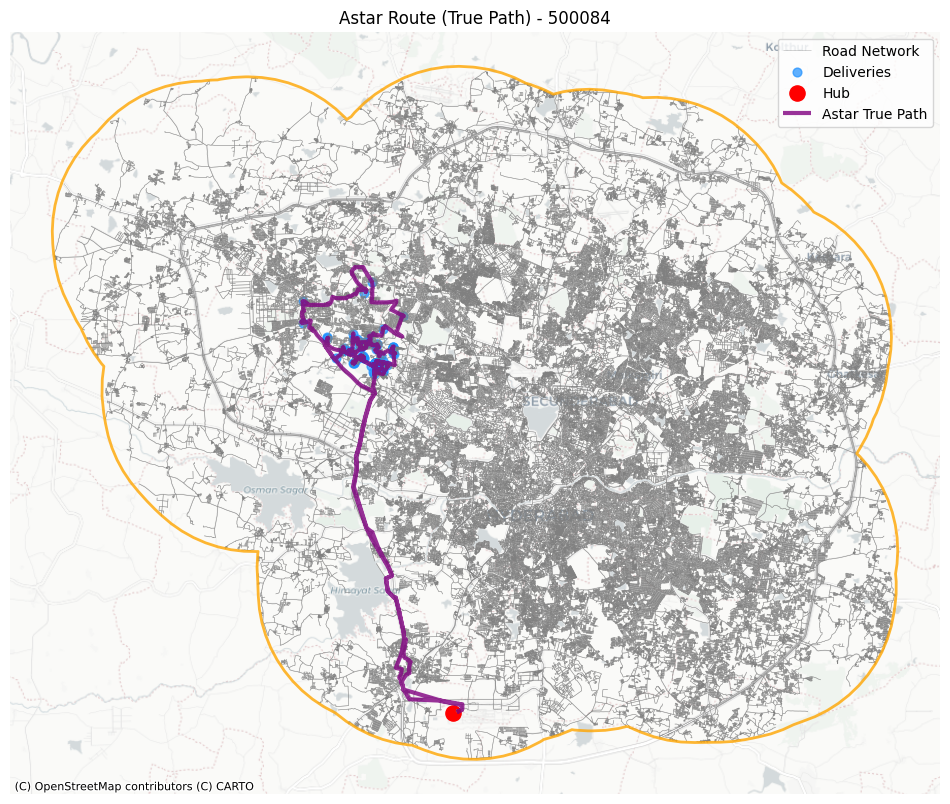

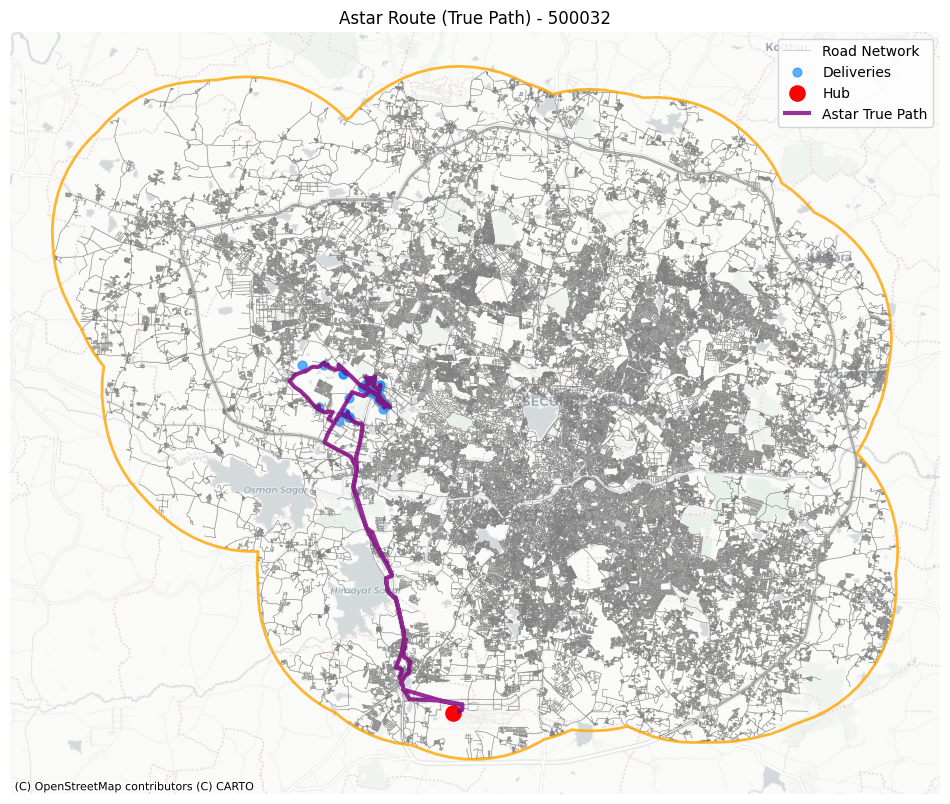

In [99]:
gdfs = {
    'deliveries': deliveries,
    'hub': hub,
    'admin': hyd_buffered_gdf_3857,
    'edges': edges_exp_3857
}

for result in results_astar:
    algo_name = result['algorithm']
    node_ids = result['ordered_node_ids']
    cluster_label = result['assigned_pincode']
    cluster_df = deliveries[deliveries['assigned_pincode'] == cluster_label]
    gdfs['deliveries'] = cluster_df
    plot_route_on_map(
        G_osmnx_expanded,
        node_ids, gdfs,
        algorithm=algo_name,
        cluster_label=cluster_label,
        savefig=True
    )


# Google VRP

In [101]:
!uv add ortools

Resolved 135 packages in 2.63s
 Downloaded ortools
Prepared 4 packages in 3.40s
Installed 4 packages in 416ms
 + absl-py==2.3.0
 + immutabledict==4.2.1
 + ortools==9.13.4784
 + protobuf==6.31.1


In [4]:
import numpy as np

# Assume hub_lat, hub_lon are defined from your data
hub_coords = (hub_lat, hub_lon)

# deliveries_gdf: the deliveries for this cluster
delivery_coords = list(zip(deliveries['latitude'], deliveries['longitude']))

# All locations: depot + deliveries
locations = [hub_coords] + delivery_coords
locations = np.array(locations)  # shape (N, 2)

In [16]:
import numpy as np

def haversine_matrix(coords1, coords2=None):
    """
    Returns (N, M) matrix of distances in kilometers between two sets of coordinates.
    coords1: (N, 2) array-like [lat, lon]
    coords2: (M, 2) array-like [lat, lon], if None, will use coords1 (all pairs)
    """
    coords1 = np.array(coords1)
    if coords2 is None:
        coords2 = coords1
    else:
        coords2 = np.array(coords2)
    lat1 = np.radians(coords1[:, 0])[:, None]
    lon1 = np.radians(coords1[:, 1])[:, None]
    lat2 = np.radians(coords2[:, 0])[None, :]
    lon2 = np.radians(coords2[:, 1])[None, :]

    dlat = lat2 - lat1
    dlon = lon2 - lon1
    a = np.sin(dlat/2)**2 + np.cos(lat1)*np.cos(lat2)*np.sin(dlon/2)**2
    c = 2 * np.arcsin(np.sqrt(a))
    km = 6371 * c  # Earth radius in km
    return km


distance_matrix = haversine_matrix(locations, locations)
distance_matrix_m = (distance_matrix * 1000).astype(int).tolist()
print(distance_matrix.max(), distance_matrix.min())

33.6667027069564 0.0


In [33]:
from ortools.constraint_solver import routing_enums_pb2
from ortools.constraint_solver import pywrapcp

def solve_vrp(distance_matrix, num_vehicles=1, depot_index=0, verbose=False):
    """
    Solves VRP for a given distance matrix using OR-Tools.

    Args:
        distance_matrix: 2D array or list of distances (meters, int).
        num_vehicles: Number of vehicles to use.
        depot_index: Index of the depot (default: 0, i.e., first point).
        verbose: If True, prints route details.

    Returns:
        routes: List of routes (each route is a list of node indices).
        route_distances: List of route distances (meters).
    """
    data = {
        'distance_matrix': distance_matrix,
        'num_vehicles': num_vehicles,
        'depot': depot_index
    }

    manager = pywrapcp.RoutingIndexManager(
        len(data['distance_matrix']),
        data['num_vehicles'],
        data['depot']
        )
    routing = pywrapcp.RoutingModel(manager)

    def distance_callback(from_index, to_index):
        from_node = manager.IndexToNode(from_index)
        to_node = manager.IndexToNode(to_index)
        return int(data['distance_matrix'][from_node][to_node])  # meters

    transit_callback_index = routing.RegisterTransitCallback(distance_callback)
    routing.SetArcCostEvaluatorOfAllVehicles(transit_callback_index)

    search_parameters = pywrapcp.DefaultRoutingSearchParameters()
    search_parameters.first_solution_strategy = (
        routing_enums_pb2.FirstSolutionStrategy.PATH_CHEAPEST_ARC)

    solution = routing.SolveWithParameters(search_parameters)

    routes = []
    route_distances = []

    if solution:
        for vehicle_id in range(data['num_vehicles']):
            index = routing.Start(vehicle_id)
            route = []
            route_distance = 0
            while not routing.IsEnd(index):
                node = manager.IndexToNode(index)
                route.append(node)
                previous_index = index
                index = solution.Value(routing.NextVar(index))
                route_distance += routing.GetArcCostForVehicle(previous_index, index, vehicle_id)
            route.append(manager.IndexToNode(index))  # End at depot
            routes.append(route)
            route_distances.append(route_distance)
            if verbose:
                print(f"Route for vehicle {vehicle_id}: {route} — \nDistance: {route_distance / 1000:.3f} km")
    else:
        if verbose:
            print("No solution found.")
        routes = None
        route_distances = None

    return routes, route_distances


In [19]:
routes, route_distances = solve_vrp(distance_matrix_m, verbose=True)

Route for vehicle 0: [0, 171, 16, 523, 17, 198, 251, 545, 484, 438, 398, 279, 201, 118, 114, 89, 437, 15, 464, 265, 250, 249, 192, 51, 458, 227, 604, 60, 61, 240, 245, 147, 597, 485, 468, 580, 465, 221, 246, 57, 58, 229, 235, 244, 456, 598, 600, 601, 602, 481, 457, 459, 226, 39, 603, 242, 243, 219, 592, 230, 34, 461, 26, 462, 42, 55, 56, 222, 579, 578, 33, 220, 237, 585, 444, 435, 36, 5, 446, 421, 1, 32, 258, 420, 31, 277, 278, 29, 430, 287, 517, 414, 512, 2, 3, 253, 284, 440, 508, 419, 529, 519, 447, 280, 30, 445, 288, 511, 471, 225, 455, 581, 41, 40, 582, 470, 233, 37, 239, 238, 467, 463, 574, 35, 573, 576, 599, 482, 460, 59, 52, 47, 45, 44, 38, 248, 583, 228, 587, 466, 594, 475, 474, 476, 477, 593, 46, 478, 589, 236, 234, 232, 50, 479, 480, 223, 48, 49, 483, 590, 53, 595, 54, 151, 469, 577, 409, 259, 522, 586, 451, 266, 18, 425, 254, 4, 260, 510, 264, 416, 433, 442, 501, 514, 255, 7, 158, 256, 450, 524, 423, 424, 14, 575, 43, 285, 584, 572, 231, 6, 275, 8, 9, 10, 11, 12, 13, 418, 53

In [23]:
deliveries.columns

Index(['address', 'latitude', 'longitude', 'distance_from_hub_km',
       'cluster_kmeans', 'cluster_name', 'assigned_pincode', 'geometry'],
      dtype='object')

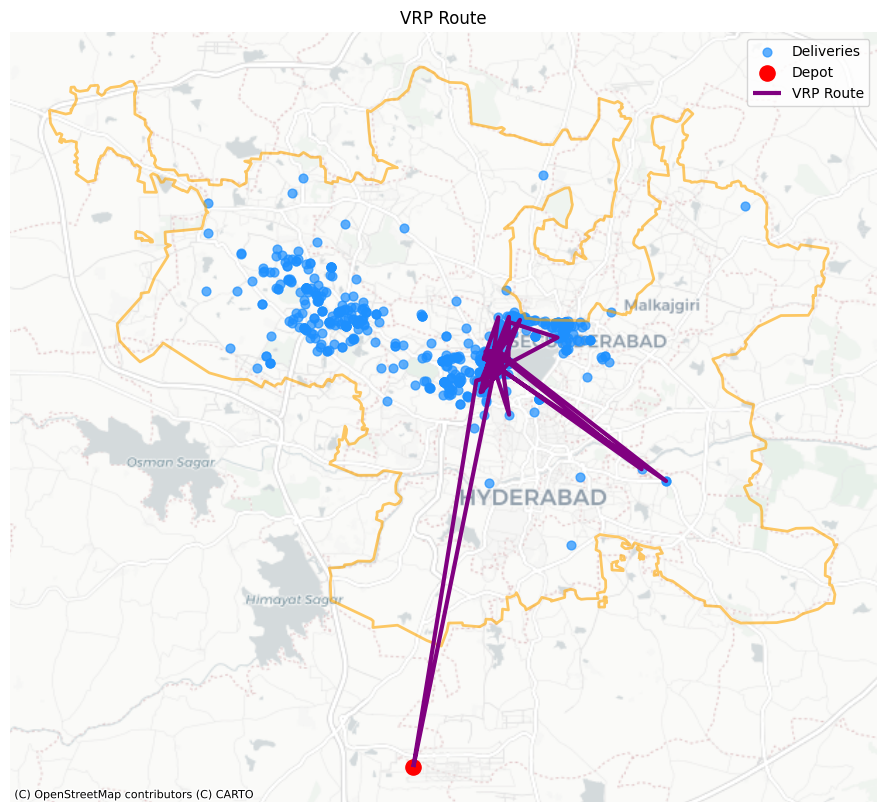

In [41]:
import matplotlib.pyplot as plt
import contextily as ctx
from shapely.geometry import LineString
import geopandas as gpd

def plot_vrp_route(locations, route_indices, admin_gdf, hub_label="Depot", title="VRP Route"):
    # Extract route points in (lon, lat)
    route_coords = [(locations[i][1], locations[i][0]) for i in route_indices]  # (lon, lat)
    route_line = LineString(route_coords)
    route_gdf = gpd.GeoDataFrame(geometry=[route_line], crs="EPSG:4326").to_crs(epsg=3857)
    
    # Points as GeoDataFrame
    points_gdf = gpd.GeoDataFrame(
        geometry=[gpd.points_from_xy([lon], [lat])[0] for lat, lon in locations],
        crs="EPSG:4326"
    ).to_crs(epsg=3857)
    
    fig, ax = plt.subplots(figsize=(12, 10))
    admin_gdf.to_crs(epsg=3857).boundary.plot(ax=ax, color="orange", linewidth=2, alpha=0.6)
    points_gdf.plot(ax=ax, color="dodgerblue", markersize=40, alpha=0.7, label="Deliveries")
    points_gdf.iloc[[0]].plot(ax=ax, color="red", markersize=120, label=hub_label)
    route_gdf.plot(ax=ax, color="purple", linewidth=3, label="VRP Route")
    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
    ax.set_axis_off()
    plt.legend()
    plt.title(title)
    plt.show()


routes_flat = np.array(routes).flatten()
plot_vrp_route(locations, routes_flat, hyd_admin)


## Per Cluster

In [ ]:
import osmnx as ox
import geopandas as gpd
import matplotlib.pyplot as plt
import contextily as ctx

# Buffer in meters using EPSG:3857
hyd_admin_3857 = hyd_admin.to_crs(epsg=3857)
hyd_buffered_3857 = hyd_admin_3857.geometry.buffer(10_000)

# Create GeoDataFrame with EPSG:3857
hyd_buffered_gdf_3857 = gpd.GeoDataFrame(geometry=hyd_buffered_3857, crs="EPSG:3857")

# Project *just the geometry* to EPSG:4326 for OSMnx
hyd_buffered_wgs = hyd_buffered_gdf_3857.to_crs(epsg=4326)
hyd_polygon_buffered = hyd_buffered_wgs.geometry.iloc[0]

# Get the expanded road network
G_osmnx_expanded = ox.graph_from_polygon(hyd_polygon_buffered, network_type='drive')
nodes_exp, edges_exp = ox.graph_to_gdfs(G_osmnx_expanded)

# Make sure ALL layers for plotting are in 3857
edges_exp_3857 = edges_exp.to_crs(epsg=3857)
deliveries_3857 = deliveries.to_crs(epsg=3857)
hub_3857 = hub.to_crs(epsg=3857)

# Plot
fig, ax = plt.subplots(figsize=(12,10))
edges_exp_3857.plot(ax=ax, linewidth=0.4, color='gray', alpha=0.6, label='Expanded Roads')
hyd_buffered_gdf_3857.boundary.plot(ax=ax, color='orange', linewidth=2, label='Buffered City Boundary')
deliveries_3857.plot(ax=ax, color='dodgerblue', markersize=20, label='Deliveries')
hub_3857.plot(ax=ax, color='red', markersize=120, label='Hub')
ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
ax.set_axis_off()
plt.legend()
plt.title("Expanded Road Network (Buffered Hyderabad Boundary)")
plt.show()


In [ ]:
gdfs = {
    'deliveries': deliveries,
    'hub': hub,
    'admin': hyd_buffered_gdf_3857,
    'edges': edges_exp_3857
}

In [64]:
def plot_vrp_route(
    locations, route_indices, admin_gdf, roads_gdf=None, 
    hub_label="Depot", title="VRP Route", pincode=None,
    algorithm="vrp", savefig=False,
):
    # Extract route points in (lon, lat)
    route_coords = [(locations[i][1], locations[i][0]) for i in route_indices]  # (lon, lat)
    route_line = LineString(route_coords)
    route_gdf = gpd.GeoDataFrame(geometry=[route_line], crs="EPSG:4326").to_crs(epsg=3857)
    
    # Points as GeoDataFrame
    points_gdf = gpd.GeoDataFrame(
        geometry=[gpd.points_from_xy([lon], [lat])[0] for lat, lon in locations],
        crs="EPSG:4326"
    ).to_crs(epsg=3857)

    # Transform roads and admin to same CRS        
    admin_3857 = admin_gdf.to_crs(epsg=3857)
    
    fig, ax = plt.subplots(figsize=(12, 10))
    if roads_gdf is not None:
        roads_3857 = roads_gdf.to_crs(epsg=3857)
        roads_3857.plot(ax=ax, linewidth=0.3, color="gray", alpha=0.5, label="Road Network")
    admin_3857.boundary.plot(ax=ax, color="orange", linewidth=2, alpha=0.6)
    points_gdf.plot(ax=ax, color="dodgerblue", markersize=40, alpha=0.7, label="Deliveries")
    points_gdf.iloc[[0]].plot(ax=ax, color="red", markersize=120, label=hub_label)
    route_gdf.plot(ax=ax, color="purple", linewidth=3, label="VRP Route")
    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
    ax.set_axis_off()
    plt.legend()
    plt.title(title)
    if savefig and (pincode is not None):
        filename = f"../outputs/route_{pincode}_{algorithm}.png"
        plt.savefig(filename, bbox_inches="tight", dpi=500, transparent=True)

    plt.show()


In [56]:
cluster_results = {}

for pincode in deliveries['assigned_pincode'].unique():
    if pincode == "500001":
        continue
    cluster_df = deliveries[deliveries['assigned_pincode'] == pincode]
    print(f"Running VRP for cluster {pincode} with {len(cluster_df)} deliveries.")

    cluster_locations = [(hub_lat, hub_lon)] + list(zip(cluster_df['latitude'], cluster_df['longitude']))
    distance_matrix = haversine_matrix(cluster_locations, cluster_locations)
    distance_matrix_m = (distance_matrix * 1000).astype(int).tolist()  # in meters

    routes, route_distances = solve_vrp(distance_matrix_m, num_vehicles=1, depot_index=0, verbose=True)

    cluster_results[pincode] = {
        'routes': routes,
        'route_distances': route_distances,
        'num_deliveries': len(cluster_df)
    }


Running VRP for cluster 500033 with 91 deliveries.
Route for vehicle 0: [0, 29, 28, 18, 17, 91, 44, 27, 47, 24, 36, 78, 31, 62, 45, 26, 19, 25, 32, 61, 23, 22, 21, 20, 84, 51, 52, 74, 50, 60, 75, 30, 13, 83, 12, 7, 8, 72, 80, 35, 68, 69, 9, 40, 41, 43, 79, 67, 5, 81, 66, 65, 63, 64, 82, 73, 85, 59, 76, 77, 49, 87, 71, 57, 16, 11, 6, 4, 3, 1, 58, 34, 48, 14, 15, 39, 42, 46, 53, 86, 88, 89, 90, 70, 56, 54, 37, 2, 33, 10, 55, 38, 0] — 
Distance: 81.162 km
Running VRP for cluster 500081 with 89 deliveries.
Route for vehicle 0: [0, 63, 62, 67, 66, 64, 65, 84, 83, 82, 86, 85, 69, 87, 88, 72, 6, 75, 41, 53, 76, 61, 16, 19, 18, 17, 15, 14, 68, 38, 52, 23, 56, 50, 42, 44, 45, 46, 57, 39, 59, 32, 31, 35, 34, 30, 37, 36, 33, 43, 70, 40, 21, 22, 54, 20, 49, 48, 74, 81, 73, 77, 71, 79, 80, 78, 2, 58, 89, 7, 8, 9, 10, 11, 12, 13, 24, 25, 26, 27, 28, 29, 3, 4, 51, 5, 1, 55, 47, 60, 0] — 
Distance: 69.489 km
Running VRP for cluster 500084 with 75 deliveries.
Route for vehicle 0: [0, 4, 2, 37, 66, 52, 

Saved: ../outputs/route_500033_vrp.png


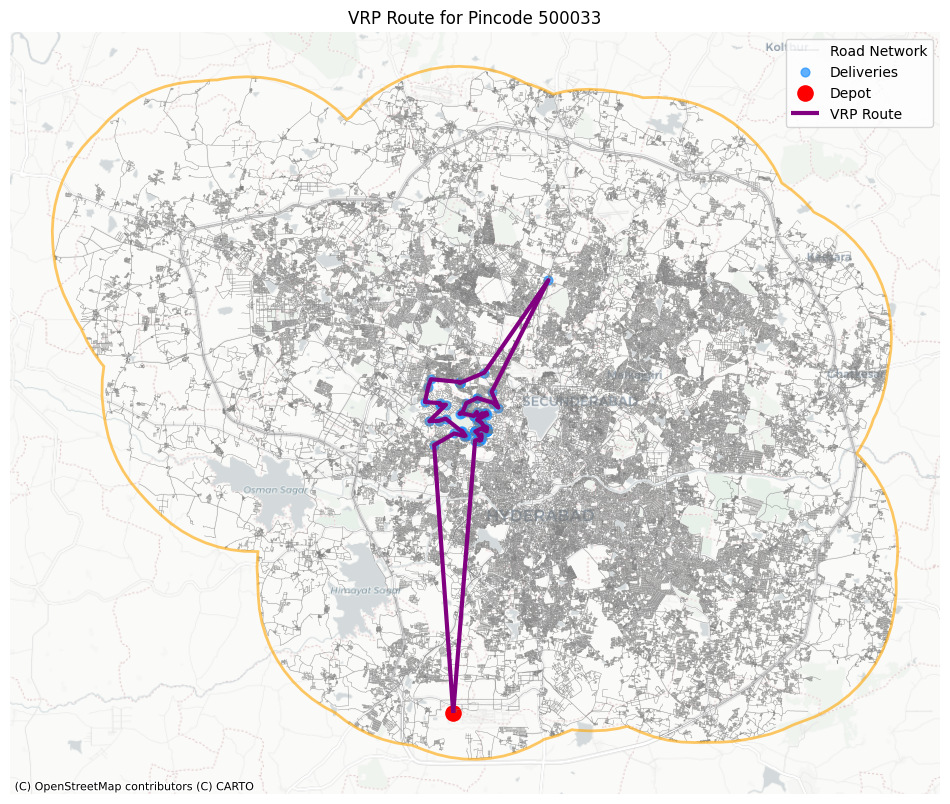

Saved: ../outputs/route_500081_vrp.png


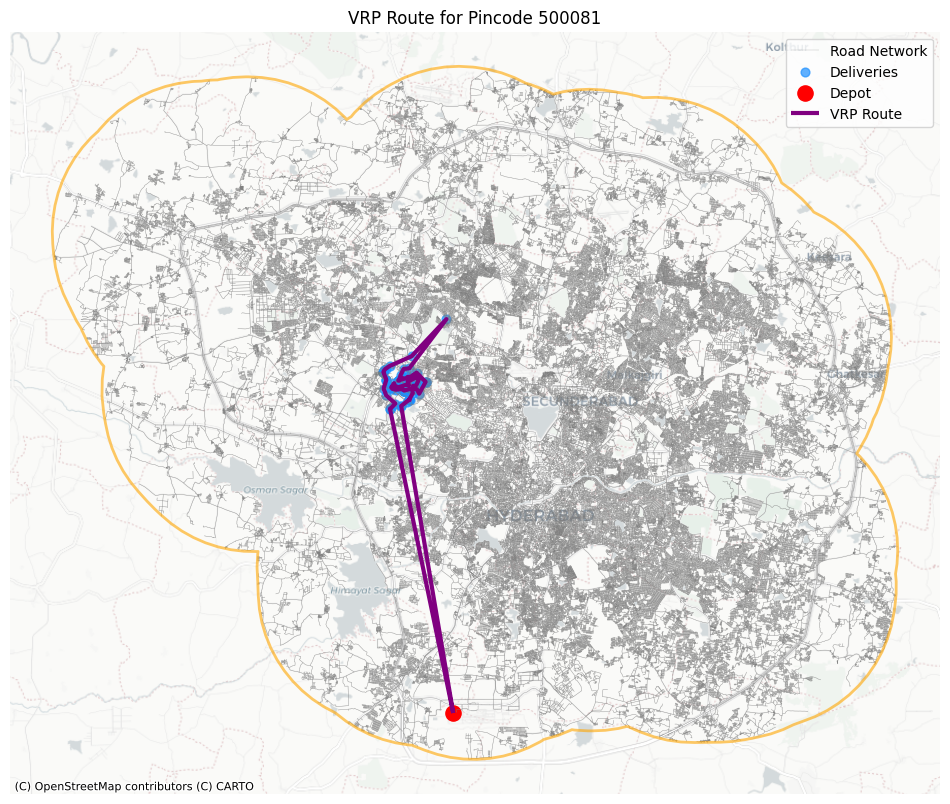

Saved: ../outputs/route_500084_vrp.png


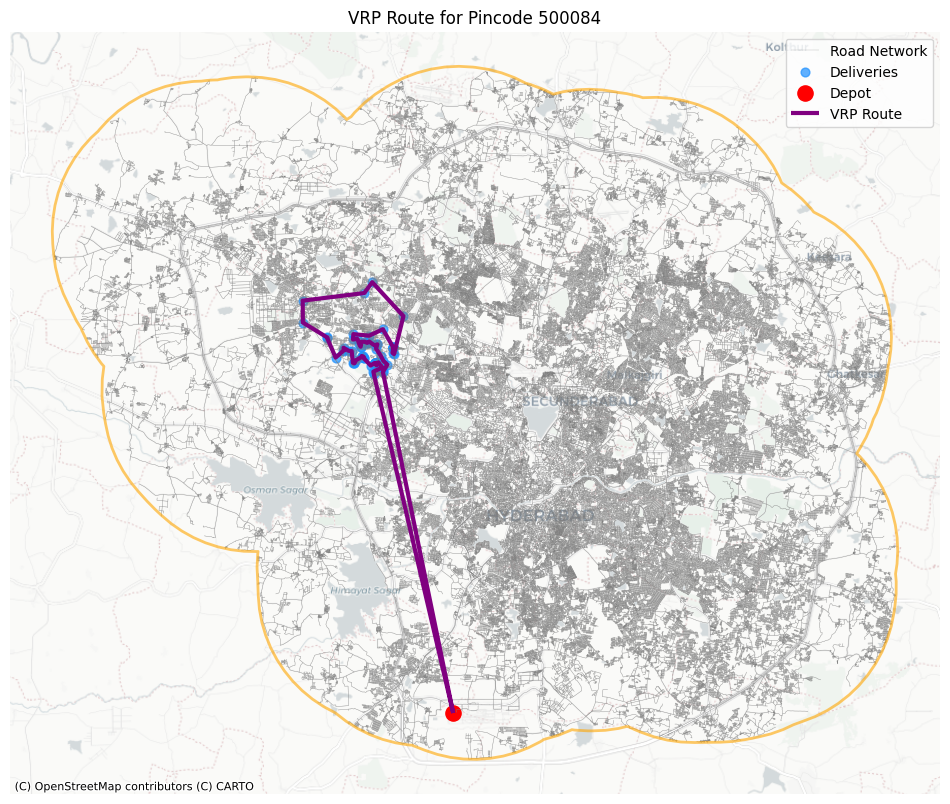

Saved: ../outputs/route_500032_vrp.png


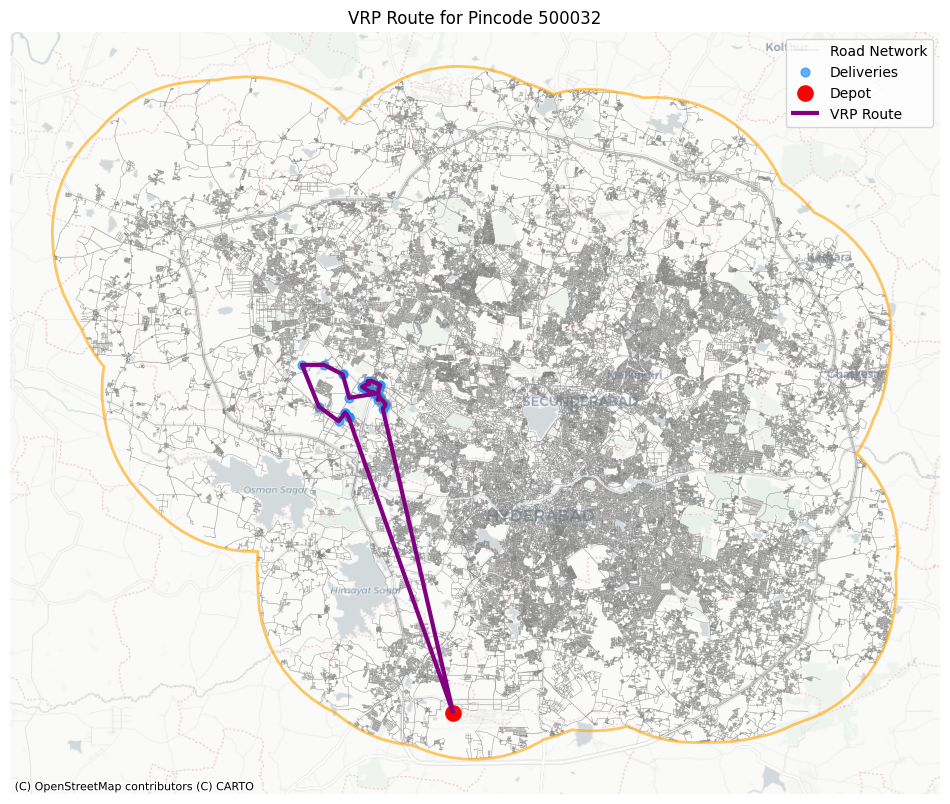

In [62]:
for pincode, result in cluster_results.items():
    # Skip clusters with no routes
    if not result['routes']:
        print(f"Cluster {pincode}: No route to plot.")
        continue

    # Always take the first (or only) vehicle route
    route_indices = result['routes'][0]
    cluster_df = deliveries[deliveries['assigned_pincode'] == pincode]

    # The hub is at index 0, then all cluster delivery locations
    cluster_locations = [(hub_lat, hub_lon)] + list(zip(cluster_df['latitude'], cluster_df['longitude']))

    plot_vrp_route(
        locations=cluster_locations,
        route_indices=route_indices,
        admin_gdf=hyd_buffered_gdf_3857,
        roads_gdf=edges_exp_3857,
        hub_label="Depot",
        title=f"VRP Route for Pincode {pincode}",
        pincode=pincode,
        algorithm="vrp",
        savefig=True
        )
